## Sim Demo

### Imports

In [5]:
%load_ext autoreload
%autoreload 2

In [1]:
from env.imports import *

/ext3/miniconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (
2025-04-18 12:29:14.790729: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-18 12:29:16.393183: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-04-18 12:29:18.431847: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [ ]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

#### Check job specs

In [3]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 7.3%
RAM Usage: 8.0%
Available RAM: 347.1G
Total RAM: 377.1G
52.4G


In [4]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


None
Available GPUs: 0


#### Data viz <a id="sims"></a>

In [16]:
from data.data_load import load_transcriptome, load_connectome
from data.data_viz import plot_connectome, plot_transcriptome


In [11]:
import netneurotools
from netneurotools.datasets import fetch_schaefer2018
from netneurotools.plotting import plot_fsaverage
from netneurotools import datasets as nndata

In [13]:
# Fetch Schaefer2018 annotation files (fsaverage, 400 parcel scale)
schaefer = fetch_schaefer2018('fsaverage', data_dir='data/UKBB', verbose=True)
lh_annot, rh_annot = schaefer['400Parcels7Networks']

# Generate fake brain data (e.g. 400 parcels, random)
values = np.random.rand(400)

Please cite the following papers if you are using this function:
  [primary]:
    Alexander Schaefer, Ru Kong, Evan M Gordon, Timothy O Laumann, Xi-Nian Zuo, Avram J Holmes, Simon B Eickhoff, and BT Thomas Yeo. Local-global parcellation of the human cerebral cortex from intrinsic functional connectivity mri. Cerebral cortex, 28(9):3095–3114, 2018.
Dataset atl-schaefer2018 already exists. Skipping download.


In [15]:
schaefer

{'100Parcels7Networks': Surface(L=PosixPath('data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-L_desc-100Parcels7Networks_deterministic.annot'), R=PosixPath('data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-R_desc-100Parcels7Networks_deterministic.annot')),
 '100Parcels17Networks': Surface(L=PosixPath('data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-L_desc-100Parcels17Networks_deterministic.annot'), R=PosixPath('data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-R_desc-100Parcels17Networks_deterministic.annot')),
 '200Parcels7Networks': Surface(L=PosixPath('data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-L_desc-200Parcels7Networks_deterministic.annot'), R=PosixPath('data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-R_desc-200Parcels7Networks_deterministic.annot')),
 '200Parcels17Networks': Surface(L=PosixPath('data/UKBB/atl-schaefer20

In [16]:
print(lh_annot)
print(rh_annot)
print(values)

data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-L_desc-400Parcels7Networks_deterministic.annot
data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-R_desc-400Parcels7Networks_deterministic.annot
[0.76663856 0.41267814 0.27586236 0.70651393 0.66151397 0.72660798
 0.27751458 0.10021654 0.33407241 0.62078755 0.9474879  0.83824456
 0.75908807 0.65205005 0.35161544 0.70217315 0.33711949 0.32243281
 0.35791335 0.96440373 0.52501811 0.35085317 0.69708118 0.24391628
 0.14474648 0.85842352 0.96396882 0.00768645 0.99062868 0.7176064
 0.20383214 0.11752733 0.10375953 0.65078235 0.40908346 0.79184221
 0.13220726 0.29969646 0.31450914 0.17784885 0.5925708  0.93414064
 0.2723304  0.68049048 0.82667279 0.99598021 0.86154363 0.37004782
 0.17683976 0.23179065 0.96027124 0.2805404  0.98680696 0.58475761
 0.94963325 0.49145081 0.07258605 0.84474189 0.14792812 0.01353899
 0.35734478 0.24951967 0.61684604 0.46567012 0.58479166 0.86693979
 0.86443099 0.795291

In [17]:
from netneurotools.datasets import fetch_schaefer2018
from netneurotools.plotting import plot_fsaverage
from IPython.display import Image, display

In [18]:
#lh_annot, rh_annot = schaefer.lh, schaefer.rh
absolute_path = '/scratch/asr655/neuroinformatics/GeneEx2Conn'

lh_annot = absolute_path + '/data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-L_desc-400Parcels7Networks_deterministic.annot'
rh_annot = absolute_path + '/data/UKBB/atl-schaefer2018/fsaverage/atl-Schaefer2018_space-fsaverage_hemi-R_desc-400Parcels7Networks_deterministic.annot'

# Generate some dummy data for 400 parcels (replace with your own data)
values = np.random.rand(400)



In [19]:

# Plot using netneurotools; this returns a PySurfer Brain object.
brain = plot_fsaverage(
    data=values,
    lhannot=lh_annot,
    rhannot=rh_annot,
    order='lr',
    cmap='viridis',
    vmin=0,
    vmax=1
)

# Save the current brain view to an image file
brain.save_image("brain_plot.png")

# Display the image inline in the notebook
display(Image("brain_plot.png"))

Please cite the following papers if you are using this function:
  [primary]:
    Anders M Dale, Bruce Fischl, and Martin I Sereno. Cortical surface-based analysis: i. segmentation and surface reconstruction. Neuroimage, 9(2):179–194, 1999.
    Bruce Fischl, Martin I Sereno, and Anders M Dale. Cortical surface-based analysis: ii: inflation, flattening, and a surface-based coordinate system. Neuroimage, 9(2):195–207, 1999.
    Bruce Fischl, Martin I Sereno, Roger BH Tootell, and Anders M Dale. High-resolution intersubject averaging and a coordinate system for the cortical surface. Human brain mapping, 8(4):272–284, 1999.
Dataset tpl-fsaverage already exists. Skipping download.


: 

In [ ]:

X = load_transcriptome(parcellation='S400', hemisphere='both', omit_subcortical=False, sort_genes='expression', impute_strategy='mirror_interpolate')
Y = load_connectome(parcellation='S400', hemisphere='both', omit_subcortical=False)

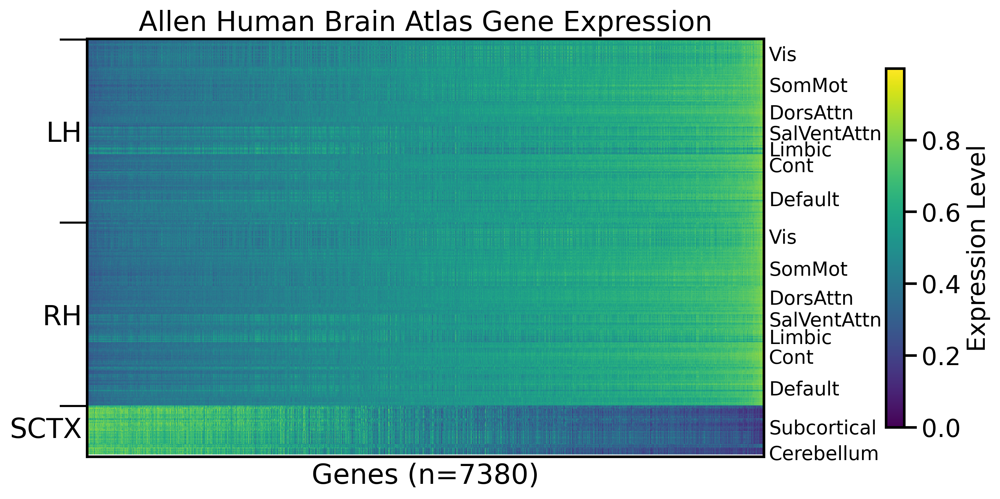

In [8]:
plot_transcriptome(null_model='none', parcellation='S400', hemisphere='both', omit_subcortical=False, gene_list='0.2', sort_genes='expression', impute_strategy='mirror_interpolate') #, add_hemisphere_labels=True, add_network_labels=False)

spinning gene expression


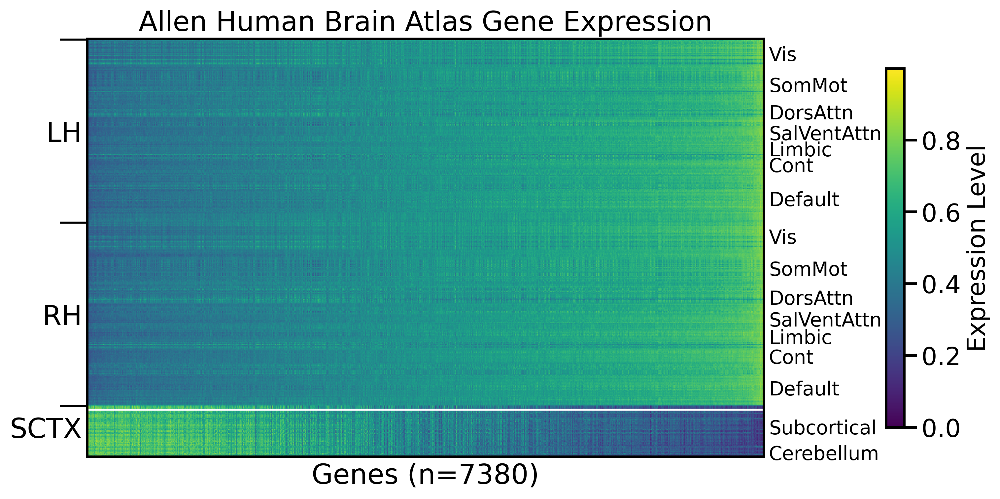

In [9]:
plot_transcriptome(null_model='spin', parcellation='S400', hemisphere='both', omit_subcortical=False, gene_list='0.2', sort_genes='expression', impute_strategy='mirror_interpolate') #, add_hemisphere_labels=True, add_network_labels=False)

In [ ]:

# Start virtual framebuffer for offscreen rendering
pv.start_xvfb()

vertex_data = np.random.rand(400)  # Assuming Schaefer400, one value per parcel

# Plot and save to file
pv_plot_surface(vertex_data,
                template='fsaverage',
                surf='inflated',
                hemi='both',
                layout='row',
                cmap='viridis',
                mask_medial=True,
                show_colorbar=True,
                show_plot=True,
                save_fig='output_brain_surface.png')

/ext3/miniconda3/lib/python3.11/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


ImportError: cannot import name 'pv_plot_surface' from 'netneurotools.plotting' (/ext3/miniconda3/lib/python3.11/site-packages/netneurotools/plotting.py)

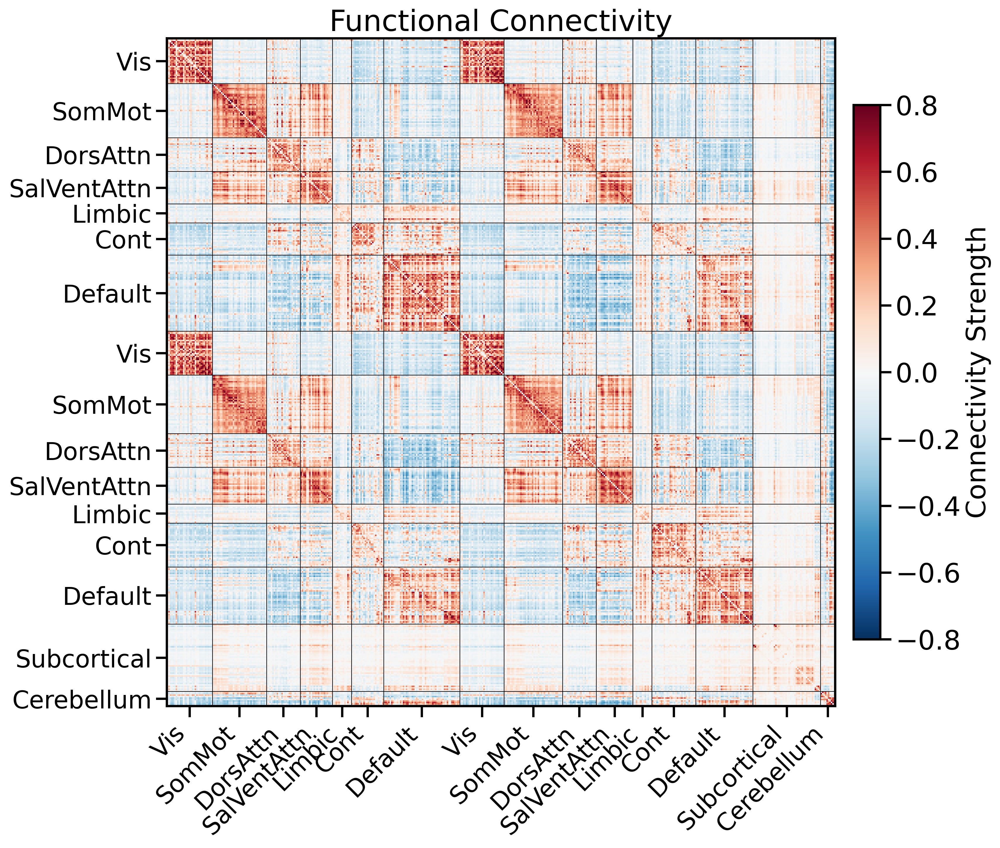

In [113]:
plot_connectome(parcellation='S400', hemisphere='both', measure='FC', omit_subcortical=False, add_network_labels=True)